# Exploration 노드 7 


## 라이브러리 불러오기

In [192]:
import os
import urllib
import cv2
import numpy as np
from pixellib.semantic import semantic_segmentation
from matplotlib import pyplot as plt


## (1) 인물 모드 사진
3 개의 이미지를 인물 모드 사진으로 바꿀 예정이다. 세그멘테이션을 이용해서 사람과 배경을 나누고, 배경은 블러처리를 해주면서 아웃포커싱한 사진인 인물 모드 사진과 굉장히 비슷해진다. 
### 이미지 1

(1969, 1920, 3)


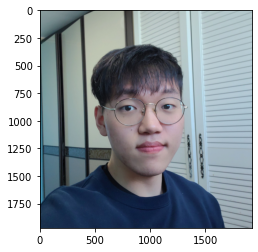

In [193]:
# 본인이 선택한 이미지의 경로에 맞게 바꿔 주세요.
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/my_image.png'  
img_orig = cv2.imread(img_path) 

print(img_orig.shape)
plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.show()

pixellib에서 모델을 다운받아서 세그멘테이션을 진행한다. 

In [194]:
# 저장할 파일 이름을 결정합니다
model_dir = os.getenv('HOME')+'/aiffel/human_segmentation/models'
model_file = os.path.join(model_dir, 'deeplabv3_xception_tf_dim_ordering_tf_kernels.h5')

# PixelLib가 제공하는 모델의 url입니다
model_url = 'https://github.com/ayoolaolafenwa/PixelLib/releases/download/1.1/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5'

# 다운로드를 시작합니다
urllib.request.urlretrieve(model_url, model_file)

('/aiffel/aiffel/human_segmentation/models/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5',
 <http.client.HTTPMessage at 0x7f2c42e03070>)

PASCAL VOC 데이터로 학습된 모델을 이용하여 세그멘테이션을 진행한다. 결과는 다음의 이미지와 같다. 

In [195]:
# 모델 생성
model = semantic_segmentation()
model.load_pascalvoc_model(model_file)

In [196]:
segvalues, output = model.segmentAsPascalvoc(img_path)

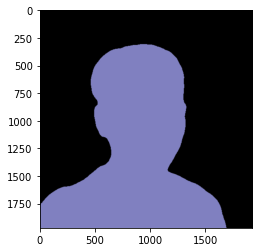

In [198]:
plt.imshow(output)
plt.show()

PASCAL VOC의 라벨은 다음과 같다. segvalues를 확인하면 background와 person으로 구분한 것을 알 수 있다. 

In [197]:
LABEL_NAMES = [
    'background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus',
    'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike',
    'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tv'
]
len(LABEL_NAMES)

21

In [199]:
segvalues

{'class_ids': array([ 0, 15]),
 'masks': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [ True,  True,  True, ..., False, False, False],
        [ True,  True,  True, ..., False, False, False],
        [ True,  True,  True, ..., False, False, False]])}

In [200]:
for class_id in segvalues['class_ids']:
    print(LABEL_NAMES[class_id])

background
person


colormap을 확인하여 사람을 나타내는 색을 RGB 순에서 output에서 이용하는 BGR로 바꾸는 작업을 수행한다. 이를 이용하여 마스크를 만든다. 

In [201]:
# 아래 코드를 이해하지 않아도 좋습니다
# PixelLib에서 그대로 가져온 코드입니다
# 주목해야 할 것은 생상 코드 결과물이예요!
colormap = np.zeros((256, 3), dtype = int)
ind = np.arange(256, dtype=int)

for shift in reversed(range(8)):
    for channel in range(3):
        colormap[:, channel] |= ((ind >> channel) & 1) << shift
    ind >>= 3

colormap[:20]

array([[  0,   0,   0],
       [128,   0,   0],
       [  0, 128,   0],
       [128, 128,   0],
       [  0,   0, 128],
       [128,   0, 128],
       [  0, 128, 128],
       [128, 128, 128],
       [ 64,   0,   0],
       [192,   0,   0],
       [ 64, 128,   0],
       [192, 128,   0],
       [ 64,   0, 128],
       [192,   0, 128],
       [ 64, 128, 128],
       [192, 128, 128],
       [  0,  64,   0],
       [128,  64,   0],
       [  0, 192,   0],
       [128, 192,   0]])

In [202]:
colormap[15]

array([192, 128, 128])

In [203]:
seg_color = (128,128,192)

(1969, 1920)


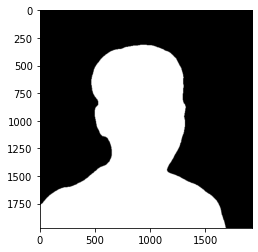

In [204]:
# output의 픽셀 별로 색상이 seg_color와 같다면 1(True), 다르다면 0(False)이 됩니다
seg_map = np.all(output==seg_color, axis=-1)
print(seg_map.shape)
plt.imshow(seg_map, cmap='gray')
plt.show()

마스크를 이용하여 세그멘테이션 된 결과를 다음과 같이 색을 이용해서 확인할 수 있다. 

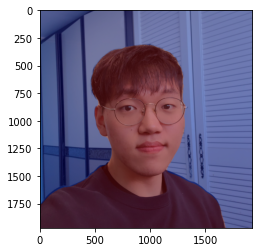

In [205]:
img_show = img_orig.copy()

# True과 False인 값을 각각 255과 0으로 바꿔줍니다
img_mask = seg_map.astype(np.uint8) * 255

# 255와 0을 적당한 색상으로 바꿔봅니다
color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)

# 원본 이미지와 마스트를 적당히 합쳐봅니다
# 0.6과 0.4는 두 이미지를 섞는 비율입니다.
img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.4, 0.0)

plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

인물 모드 사진으로 바꾸기 위해 사진을 블러 처리해준다. 사진이 워낙 커서 노드에서의 커널크기보다 큰 값인 (39,39)를 입력으로 주고 처리한다. 

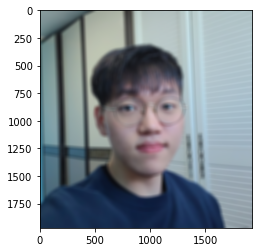

In [206]:
img_orig_blur = cv2.blur(img_orig, (39,39))  
plt.imshow(cv2.cvtColor(img_orig_blur, cv2.COLOR_BGR2RGB))
plt.show()

img_mask는 grayscale인 0~255 사이의 값으로 변환해준 마스크이다. bitwise_not을 이용하여 마스크를 반전시켜 배경이 흰색이 되도록 조정을 해준 후, bitwise_and를 이용하여 얼굴 부분은 제거해준다. 

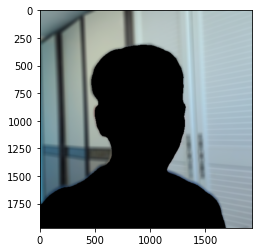

In [207]:
img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)
img_bg_mask = cv2.bitwise_not(img_mask_color)
img_bg_blur = cv2.bitwise_and(img_orig_blur, img_bg_mask)
plt.imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB))
plt.show()

마스크와 np.where를 이용하여 얼굴 부분은 원본 이미지 img_orig에서, 배경 부분은 블러처리된 이미지 img_bg_blur로 채워서 최종 인물 모드 사진을 완성한다. 

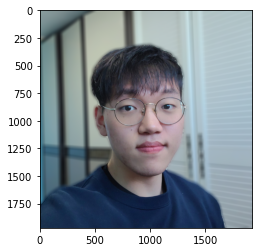

In [208]:
img_concat = np.where(img_mask_color==255, img_orig, img_bg_blur)
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

여기서 보이는 사진을 잘 보이지 않기 때문에 이미지를 저장해서 확인하겠다. 

In [209]:
save_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/my_image1_outfocused.png'  
cv2.imwrite(save_path, img_concat)

True

다음 두장의 이미지는 이와 동일한 작업을 수행해준다. 마지막에 각 사진을 살피면서 분석을 진행하겠다. 

### 이미지 2

(2880, 2160, 3)


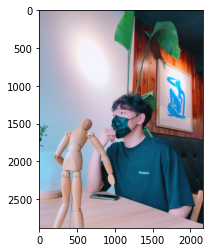

In [210]:
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/my_image2.png'  
img_orig = cv2.imread(img_path) 

print(img_orig.shape)
plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.show()

In [211]:
segvalues, output = model.segmentAsPascalvoc(img_path)

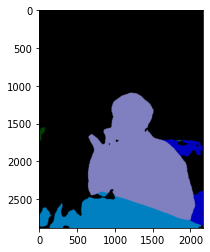

In [212]:
plt.imshow(output)
plt.show()

In [213]:
for class_id in segvalues['class_ids']:
    print(LABEL_NAMES[class_id])

background
chair
diningtable
person
pottedplant
sofa


이 이미지의 경우 배경과 사람 외에도 'chair', 'dining table', 'pottedplant', 'sofa'까지 분류가 된 것을 확인 할 수 있다. 하지만 우린 어차피 마스크를 만들 때 사람을 나타내는 seg_color를 사용할 것이기 때문에 큰 문제는 없다. 이전에 사용한 seg_color와 동일하기 때문에 다시 구하지 않고 그대로 사용해준다. 

(2880, 2160)


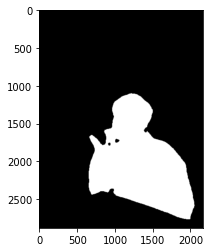

In [214]:
seg_map = np.all(output==seg_color, axis=-1)
print(seg_map.shape)
plt.imshow(seg_map, cmap='gray')
plt.show()

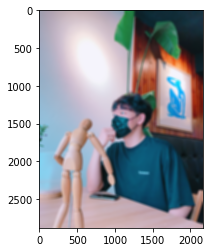

In [215]:
# 블러 처리
img_orig_blur = cv2.blur(img_orig, (39,39))  
plt.imshow(cv2.cvtColor(img_orig_blur, cv2.COLOR_BGR2RGB))
plt.show()

In [216]:
# 값이 0~255 사이에 있는 마스크로 변환
img_mask = seg_map.astype(np.uint8) * 255

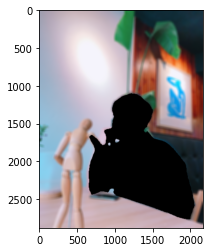

In [217]:
# 마스크 반전 후 bitwise_and로 고양이 부분 제거
img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)
img_bg_mask = cv2.bitwise_not(img_mask_color)
img_bg_blur = cv2.bitwise_and(img_orig_blur, img_bg_mask)
plt.imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB))
plt.show()

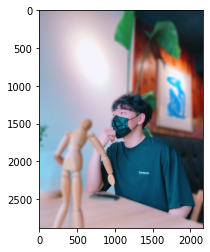

In [218]:
# 최종 이미지
img_concat = np.where(img_mask_color==255, img_orig, img_bg_blur)
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

In [219]:
save_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/my_image2_outfocused.png'  
cv2.imwrite(save_path, img_concat)

True

### 이미지 3

(1080, 1080, 3)


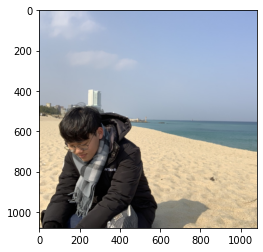

In [220]:
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/my_image3.png'  
img_orig = cv2.imread(img_path) 

print(img_orig.shape)
plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.show()

In [221]:
segvalues, output = model.segmentAsPascalvoc(img_path)

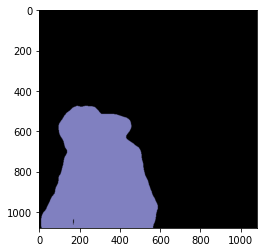

In [222]:
plt.imshow(output)
plt.show()

In [223]:
for class_id in segvalues['class_ids']:
    print(LABEL_NAMES[class_id])

background
person


(1080, 1080)


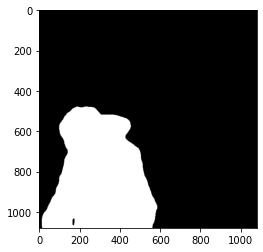

In [224]:
seg_map = np.all(output==seg_color, axis=-1)
print(seg_map.shape)
plt.imshow(seg_map, cmap='gray')
plt.show()

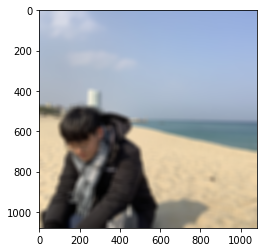

In [225]:
# 블러 처리
img_orig_blur = cv2.blur(img_orig, (26,26))  
plt.imshow(cv2.cvtColor(img_orig_blur, cv2.COLOR_BGR2RGB))
plt.show()

In [226]:
# 값이 0~255 사이에 있는 마스크로 변환
img_mask = seg_map.astype(np.uint8) * 255

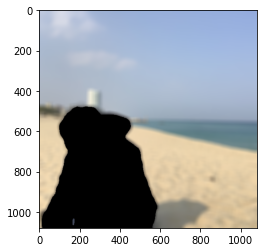

In [227]:
# 마스크 반전 후 bitwise_and로 고양이 부분 제거
img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)
img_bg_mask = cv2.bitwise_not(img_mask_color)
img_bg_blur = cv2.bitwise_and(img_orig_blur, img_bg_mask)
plt.imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB))
plt.show()

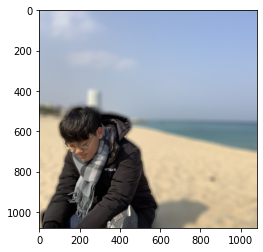

In [228]:
# 최종 이미지
img_concat = np.where(img_mask_color==255, img_orig, img_bg_blur)
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

In [229]:
save_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/my_image3_outfocused.png'  
cv2.imwrite(save_path, img_concat)

True

## (2) 고양이 아웃포커싱 사진

지금까지는 작성자의 사진을 이용하여 인물 모드 사진을 만들어왔다. 이번에는 사람이 아닌 고양이 사진으로 아웃포커싱 사진을 만들고자 한다. 아마 크게 다르지 않고, 세그멘테이션 부분에서만 조금 차이가 있고 나머지는 동일하게 작업을 해주면 될 것이라고 예상된다. 이번에 사용할 고양이사진을 불러온다. 

(853, 640, 3)


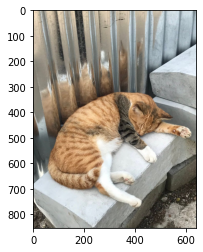

In [230]:
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/cat.png'  
img_orig = cv2.imread(img_path) 

print(img_orig.shape)
plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.show()

In [231]:
segvalues, output = model.segmentAsPascalvoc(img_path)

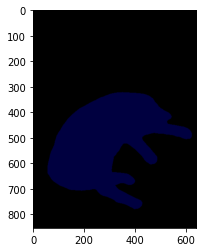

In [232]:
plt.imshow(output)
plt.show()

이전까지 진행한 내용과의 차이는 여기에 있다. 여태까지는 배경과 사람만 구분을 했다면, 이번에는 __배경과 고양이를 구분한 것이다__. 그러므로 여기서 cat의 class_id를 이용하여 color_map으로 색의 값을 찾아 마스크를 만들어주어야 한다. 그 외에는 바뀌는 내용은 없다. 

In [233]:
segvalues

{'class_ids': array([0, 8]),
 'masks': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]])}

In [234]:
for class_id in segvalues['class_ids']:
    print(LABEL_NAMES[class_id])

background
cat


고양이는 class_id가 8인 것을 알 수 있다. 

In [235]:
colormap = np.zeros((256, 3), dtype = int)
ind = np.arange(256, dtype=int)

for shift in reversed(range(8)):
    for channel in range(3):
        colormap[:, channel] |= ((ind >> channel) & 1) << shift
    ind >>= 3

colormap[:20]

array([[  0,   0,   0],
       [128,   0,   0],
       [  0, 128,   0],
       [128, 128,   0],
       [  0,   0, 128],
       [128,   0, 128],
       [  0, 128, 128],
       [128, 128, 128],
       [ 64,   0,   0],
       [192,   0,   0],
       [ 64, 128,   0],
       [192, 128,   0],
       [ 64,   0, 128],
       [192,   0, 128],
       [ 64, 128, 128],
       [192, 128, 128],
       [  0,  64,   0],
       [128,  64,   0],
       [  0, 192,   0],
       [128, 192,   0]])

In [236]:
colormap[8]

array([64,  0,  0])

In [237]:
seg_color = (0, 0, 64) #RGB에서 BGR로 변환

(853, 640)


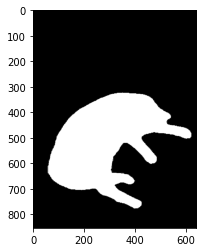

In [238]:
seg_map = np.all(output==seg_color, axis=-1)
print(seg_map.shape)
plt.imshow(seg_map, cmap='gray')
plt.show()

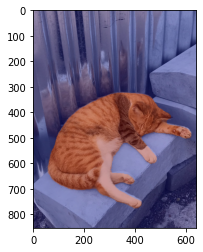

In [239]:
img_show = img_orig.copy()

# True과 False인 값을 각각 255과 0으로 바꿔줍니다
img_mask = seg_map.astype(np.uint8) * 255

# 255와 0을 적당한 색상으로 바꿔봅니다
color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)

# 원본 이미지와 마스트를 적당히 합쳐봅니다
# 0.6과 0.4는 두 이미지를 섞는 비율입니다.
img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.4, 0.0)

plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

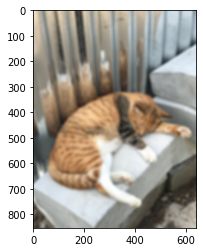

In [240]:
# 블러 처리
img_orig_blur = cv2.blur(img_orig, (13,13))  
plt.imshow(cv2.cvtColor(img_orig_blur, cv2.COLOR_BGR2RGB))
plt.show()

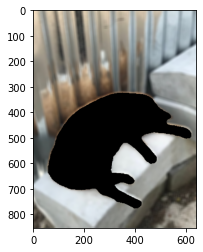

In [241]:
# 마스크 반전 후 bitwise_and로 고양이 부분 제거
img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)
img_bg_mask = cv2.bitwise_not(img_mask_color)
img_bg_blur = cv2.bitwise_and(img_orig_blur, img_bg_mask)
plt.imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB))
plt.show()

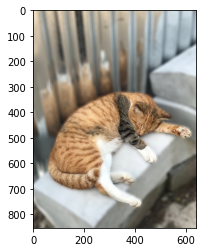

In [242]:
# 최종 이미지
img_concat = np.where(img_mask_color==255, img_orig, img_bg_blur)
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

In [243]:
# 이미지 저장
save_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/my_cat_outfocused.png'  
cv2.imwrite(save_path, img_concat)

True

## (3) 배경전환 크로마키

이전까지 진행한 방법은 세그멘테이션을 이용하여 사람/고양이와 배경을 구분한 후, 마스크를 이용하여 배경 부분에는 블러 처리 된 사진을, 사람/고양이 부분에는 원본 사진을 넣는 방법으로 아웃포커싱 사진을 만들어보았다. 배경을 교체하는 방법은 여기서 살짝만 변형을 하면 간단하게 구현할 수 있다. 단순히 배경 부분에 블러 처리 된 사진이 아닌 원하는 배경의 사진을 넣어주면 되는 것이다. 처음에 사용한 셀카와 이번에 이용할 배경사진을 불러오겠다.

(1969, 1920, 3)


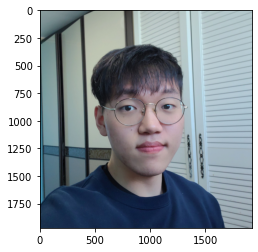

In [244]:
# 본인이 선택한 이미지의 경로에 맞게 바꿔 주세요.
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/my_image.png'  
img_orig = cv2.imread(img_path) 
bg_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/zoom_background.png'  
bg_orig = cv2.imread(bg_path) 

print(img_orig.shape)
plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.show()

(505, 898, 3)


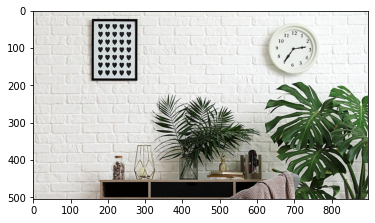

In [245]:
print(bg_orig.shape)
plt.imshow(cv2.cvtColor(bg_orig, cv2.COLOR_BGR2RGB))
plt.show()

두 사진의 크기 차이가 너무 심하다. 픽셀로 봤을 때 셀카가 오히려 배경보다 클 정도이다. 셀카의 크기를 축소하여 화질을 낮추면서 크기를 맞추도록 하겠다. 

(492, 480, 3)


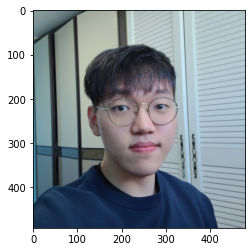

In [246]:
img_resized = cv2.resize(img_orig,(0, 0), fx=0.25, fy=0.25, interpolation=cv2.INTER_AREA)
print(img_resized.shape)
plt.imshow(cv2.cvtColor(img_resized, cv2.COLOR_BGR2RGB))
plt.show()


In [247]:
save_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/my_image_resized.png'  
cv2.imwrite(save_path, img_resized)

True

이러면 좀 더 사용하기 편하니, 축소한 이미지는 저장한다. 노드에서 배운 방법 그대로 사용하기 위해 배경을 사진의 크기와 일치하게 잘라서 사용하는 방법부터 시도해보겠다. 다음은 배경의 중앙에서 사람 사진의 크기만큼 잘라온 것이다. 

(492, 480, 3)


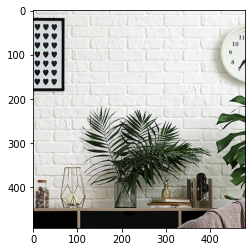

In [248]:
rows,cols,channels = img_resized.shape
bgrows, bgcols, bgchannels = bg_orig.shape
# 배경 중앙에 인물 사진의 크기만큼을 ROI로 설정
bg_resized = bg_orig[bgrows//2-rows//2:bgrows//2+rows//2, bgcols//2-cols//2:bgcols//2+cols//2] 
print(bg_resized.shape)
plt.imshow(cv2.cvtColor(bg_resized, cv2.COLOR_BGR2RGB))
plt.show()

In [249]:
segvalues, output = model.segmentAsPascalvoc(save_path)

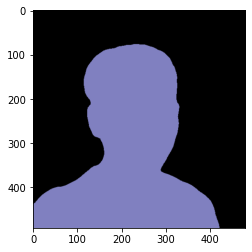

In [250]:
plt.imshow(output)
plt.show()

다시 colormap을 확인하여 seg_map을 만든다.

In [251]:
colormap = np.zeros((256, 3), dtype = int)
ind = np.arange(256, dtype=int)

for shift in reversed(range(8)):
    for channel in range(3):
        colormap[:, channel] |= ((ind >> channel) & 1) << shift
    ind >>= 3

colormap[:20]

array([[  0,   0,   0],
       [128,   0,   0],
       [  0, 128,   0],
       [128, 128,   0],
       [  0,   0, 128],
       [128,   0, 128],
       [  0, 128, 128],
       [128, 128, 128],
       [ 64,   0,   0],
       [192,   0,   0],
       [ 64, 128,   0],
       [192, 128,   0],
       [ 64,   0, 128],
       [192,   0, 128],
       [ 64, 128, 128],
       [192, 128, 128],
       [  0,  64,   0],
       [128,  64,   0],
       [  0, 192,   0],
       [128, 192,   0]])

In [252]:
colormap[15]

array([192, 128, 128])

In [253]:
seg_color = (128,128,192)

(492, 480)


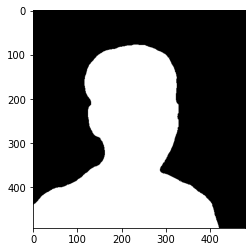

In [254]:
# output의 픽셀 별로 색상이 seg_color와 같다면 1(True), 다르다면 0(False)이 됩니다
seg_map = np.all(output==seg_color, axis=-1)
print(seg_map.shape)
plt.imshow(seg_map, cmap='gray')
plt.show()

seg_map을 이용하여 마스크를 만들어주고, 이를 반전한 마스크와 bitwise를 이용하여 배경에서 사람부분을 제외시키고 img_bg에 할당한다. 

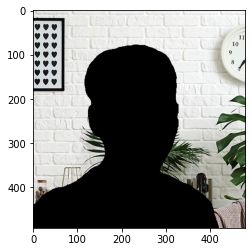

In [255]:
img_mask = seg_map.astype(np.uint8) * 255

img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)
img_bg_mask = cv2.bitwise_not(img_mask_color)
img_bg = cv2.bitwise_and(bg_resized, img_bg_mask)
plt.imshow(cv2.cvtColor(img_bg, cv2.COLOR_BGR2RGB))
plt.show()

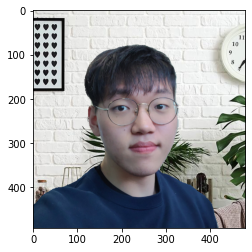

In [256]:
img_concat = np.where(img_mask_color==255, img_resized, img_bg)
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

In [257]:
save_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/my_image_bgchange.png'  
cv2.imwrite(save_path, img_concat)

True

### + 배경 원본에 추가

단순히 배경을 교체하는 것과 조금 다른 개념이지만, 넓은 배경에 사람을 추가하면 어떨까 궁금해서 다음을 진행해 보았다.  
  
방법은 아주 간단하다. 원본 배경 위에 방금 만든 이미지를 원래의 영역에 그대로 교체시켜주면 된다.
  
원하는대로 사람 부분이 추가가 된 것인데 확실히 좀 어색하게 나오는 것 같긴 하다. 

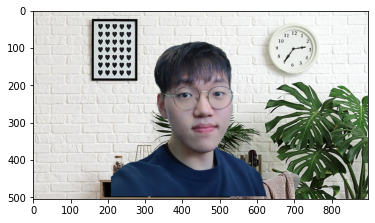

In [261]:
final = bg_orig.copy()
final[bgrows//2-rows//2:bgrows//2+rows//2, bgcols//2-cols//2:bgcols//2+cols//2] = img_concat #처음에 잘라온 배경의 영역

plt.imshow(cv2.cvtColor(final, cv2.COLOR_BGR2RGB))
plt.show()

## 사진에서 문제점 찾기
### 사진 확인

imshow는 기본적으로 고해상도 사진을 줄여서 보여주기 때문에 함수를 정의해서 좀 더 크게 바꾸고 확인하겠다. 

import matplotlib

In [266]:
def show_image_large(img_path):
    img= cv2.imread(img_path) 
    dpi = matplotlib.rcParams['figure.dpi']
    height, width, depth = img.shape
    figsize = width / (float(dpi)*2), height / (float(dpi)*2)
    plt.figure(figsize=figsize)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.show()

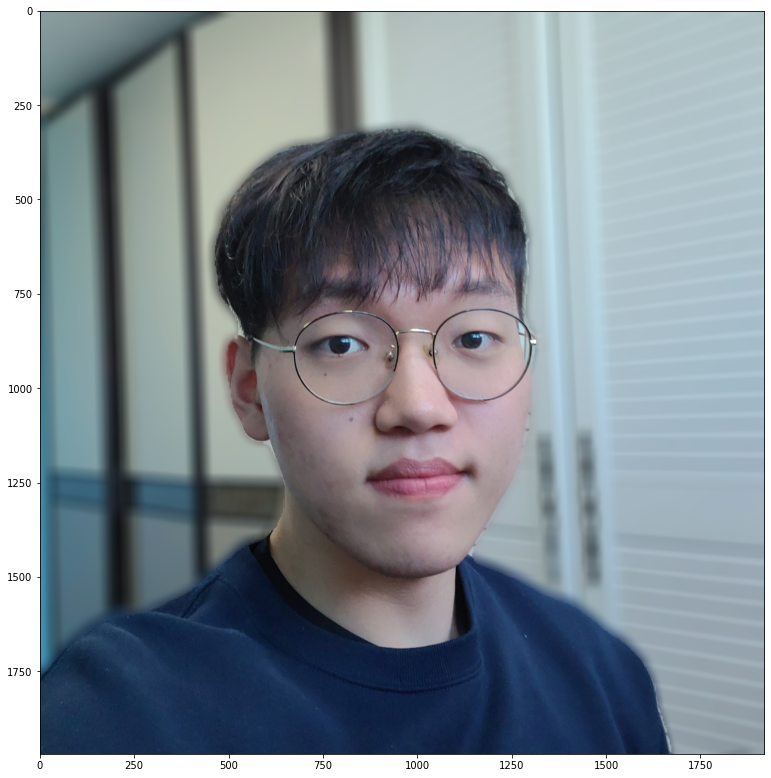

In [267]:
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/my_image1_outfocused.png'  
show_image_large(img_path)

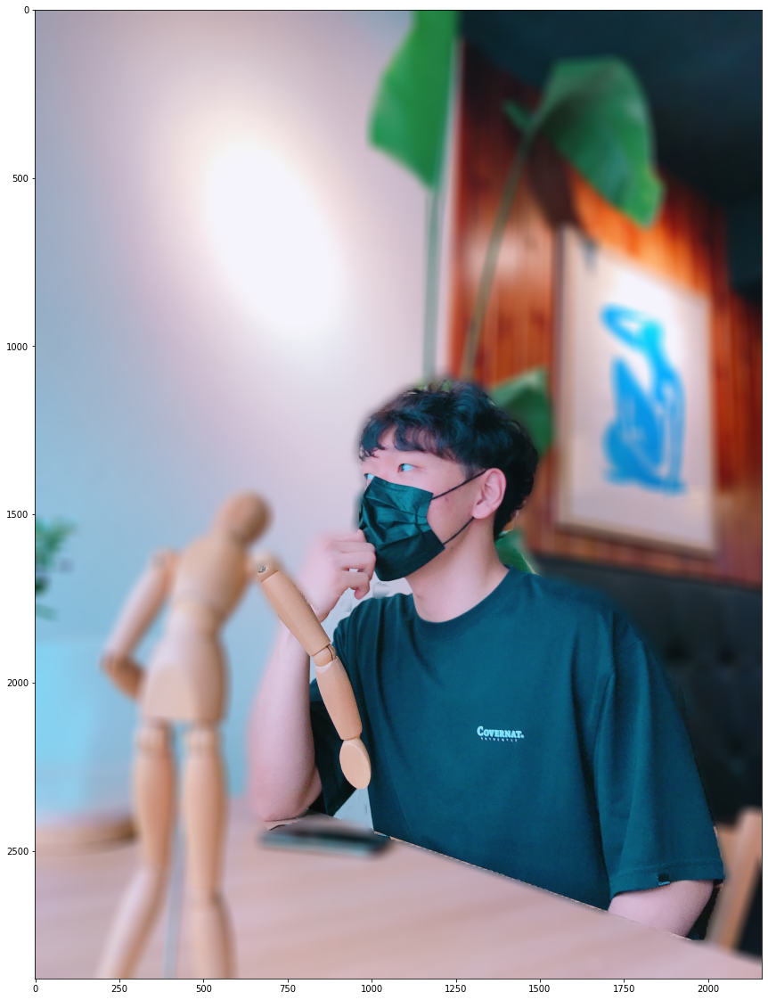

In [268]:
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/my_image2_outfocused.png'  
show_image_large(img_path)

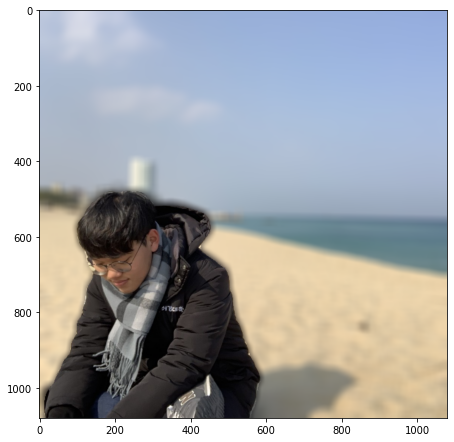

In [269]:
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/my_image3_outfocused.png'  
show_image_large(img_path)

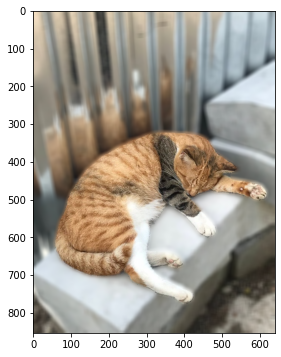

In [270]:
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/my_cat_outfocused.png'  
show_image_large(img_path)

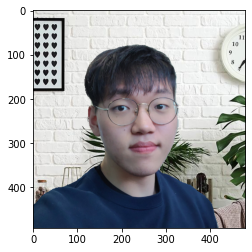

In [272]:
# 이 사진은 해상도가 작아서 imshow가 더 크게 나온다. 
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

두 번째 사진에서 문제가 가장 많이 나타나기 때문에 두 번째 사진 위주로 분석을 하겠다. 참고로 테두리 문제는 아웃포커싱 모방한 사진의 공통적인 문제점이다. 
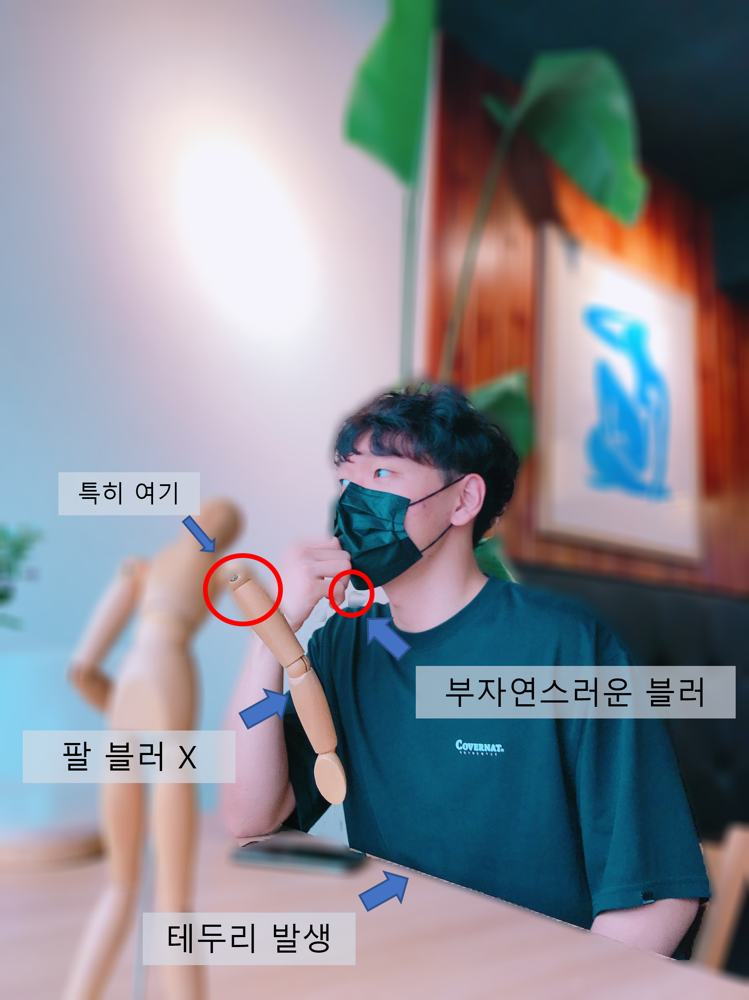

## 인물 사진의 문제점
* __테두리가 생긴다.__ 이 문제는 블러링 하는 방식 때문에 발생하는데, 주변 픽셀값에 영향을 받으면서 사람과 배경의 영역의 경계선에서 사람 영역의 픽셀값이 블러된 배경 영역에 영향을 미치면서 사람 주변에 부자연스러운 테두리가 생기게 된다. 이 테두리는 배경을 바꾼 사진에는 존재하지 않는 것으로 보아 블러의 문제점인 것을 알 수 있다. 또한, 만약 배경과 사람의 경계선이 사람쪽에 더 가까웠다면 블러된 부분이 사람 부분의 색과 비슷해서 좀 덜 티 날텐데 (ex. 3번째 해변 사진), 오히려 여기서는 경계선이 배경쪽에 있어서 문제이다. 선명하게 나오는 사람 부분에 배경이 살짝 포함되게 되면서 __어두운 사람의 색이 반영된 블러와 실제 사람인 부분 사이에 미세하게 밝은 배경이 끼게 되면서 더 선명 해지는 것이다.__  
  
  
* 세그멘테이션이 제대로 이루어지 않으면 __블러 되어야할 곳이 되지 않고, 되지 않아야 하는 부분이 되는 경우가 발생한다__. 팔과 얼굴 사이에는 블러가 되어야 하지만 제대로 되지 않았고, 사람 앞에 있는 인형의 팔은 초점보다 더 앞에 있으므로 블러가 되어야 하지만 세그멘테이션에서 사람으로 분류가 되었기 때문에 블러가 되지 않았다. 


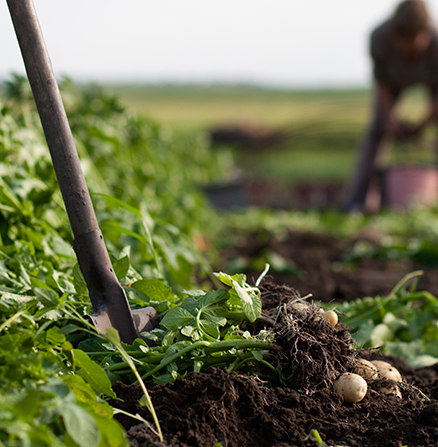

이 사진은 노드에서 걸어둔 링크에서 잘 나온 아웃포커싱된 사진인데, 왼쪽의 풀이 멀어질수록 블러가 심해지는 것을 확인할 수 있다. 뒤에 많이 먼 부분은 거의 색깔만 남아있는 셈이다. 이렇게 __초점에서의 거리가 멀어질수록 블러가 심해지도록 하는 것이 자연스럽다__ 는 것을 알 수 있다. 이번에 실험한 사진들은 모두 사람 부분의 거리가 거의 일정하기 때문에 크게 문제가 되지 않지만, 만약 사람이 옆으로 서있는 모습이어서 거리가 반영되어야 하는 사진이었다면 이번에 사용한 기법은 부자연스러운 결과를 냈을 것이다. 

## 해결 방안
테두리 문제나 자연스러운 블러의 문제는 모두 Semantic Segmentation이 제대로 되지 않아서 발생한 문제다.  
* 테두리는 만약 세그멘테이션으로 결정되는 경계선이 더 정확하게 사람과 배경을 구분하거나 오히려 사람의 영역 쪽에 있으면 저렇게 티가 나게 발생하지 않게 된다. 
* 인형의 팔의 경우, 세그멘테이션이 잘 이루어져서 사람과 확실하게 구분이 되었더라면 생기지 않았을 문제이다. 팔과 몸 사이의 이상한 블러된 점들도 세그멘테이션이 제대로 되지 않아서이다.  
  
  
이 문제를 해결해주는데 핵심적인 역할을 하는 것이 __깊이(depth) 정보__ 이다. 깊이 정보가 있다면 사람과 뒤에 있는 벽과 같이 서로 깊이가 크게 다른 부분은 서로 다른 사물로 분류하는 데 도움이 될 수 있다. 또한, 깊이 정보는 아웃포커싱하는 데에 핵심적인 역할을 할 수 있는 것이, 아웃포커싱이 애초에 초점과의 거리가 멀어짐에 따라 사진이 흐려지는 원리이기 때문이다. 초점이 사람에 맞추어져 있다면 사람과 거리를 깊이 정보를 이용하여 계산해서 적절하게 블러 처리를 하는 것이 가능해진다.  
  
당장 위의 인물 사진을 예로 들어도, 팔과 얼굴 사이에 있는 이상한 점들은 깊이 정보를 이용하면 벽으로 판단되어서 자연스럽게 영역을 나눌 수 있게 된다. 또한 인형의 팔의 경우, 깊이 정보를 이용하면 인형이 사람보다 앞에 위치해 있다는 것을 알 수 있어서 사람과 확실하게 구분할 수가 있다.

### 깊이 정보 이용 방법
노드에서 제공하는 노드에 의하면 struct2depth와 같이 소프트웨어를 이용하여 깊이 정보를 얻는 방법이 존재한다. struct2depth는 rgb정보, 즉 이미지 정보를 이용하여 깊이 정보를 알아낸다. 현재 우리는 이미 있는 사진을 인물 모드 사진과 비슷해지도록 하는 것이 목표이다. 만약 사진부터 새로 찍을 수 있는 것이라면, 3D 카메라를 이용하거나 IR 카메라를 이용한 3D Depth Sensing이 가장 이상적이겠지만, 현 상황에는 있는 이미지 정보를 활용해서 깊이 정보를 얻는 기술이 가장 적합하다고 생각한다.  
  
  
우선 원본 이미지에 대해 Semantic Segmentation 작업을 하고 struct2depth를 이용하여 깊이 정보를 얻는다. 깊이 정보를 바탕으로 Segmentation 한 내용을 보완한다. 예를 들어 segmentation에서는 인형 팔이 사람으로 분류가 되었지만, 깊이 정보를 용하여 인형이 더 앞에 있다는 것을 파악하고 이를 바탕으로 segmentation을 수정한다. __한 segment으로 분류된 영역에서 깊이 정보가 크게 변하는 부분을 제거__한다고 생각하면 되겠다. 이렇게 되면 두번 째 사진의 팔과 얼굴 사이에 벽인 공간도 확실하게 제거가 될 것이다. 보완된 segmentation 정보를 바탕으로 마스크를 만들어서 배경과 사람을 나눈 후, 사진을 블러 처리를 한다. 하지만 이 때, 깊이 정보를 이용하여 블러의 정도를 다르게 하여 더 자연스럽도록 한다. 이전에 해왔던 것처럼 이후에는 사람 영역을 원본 사진으로 채운다. 마지막으로 조금 다르게 하는 것은 깊이 정보를 사용하여 사람 영역도 초점에서 먼 부분은 블러 처리를 하는 것이다. 인물 사진은 그래도 초점이 사람에 있으니까 이때 사람 영역의 블러는 비교적으로 많이 작은 값으로 처리하여 인물이 그래도 선명하도록 한다. 이 작업을 flowchart를 이용하여 표현하면 다음과 같다.  

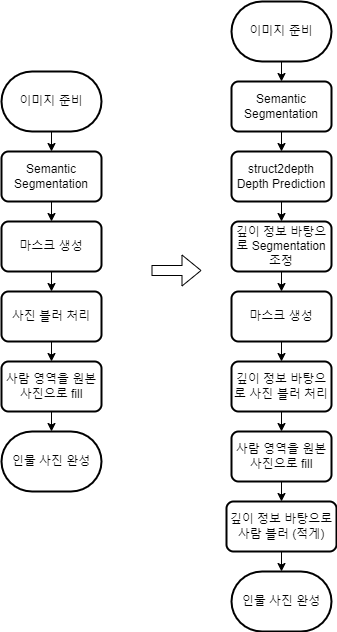

이런식으로 struct2depth 기술을 이용하면 사진 정보만 가지고도 훨씬 자연스러운 인물 모드 사진을 만들 수 있을 것이라고 기대할 수 있다. 물론 아예 3D 정보를 담기 위한 특수한 카메라를 이용한다면 더 정확하고 정교한 작업이 가능하겠지만, 지금까지 해온 DeepLab 모델의 Semantic Segmentation과 함께 이용하기에는 어려움이 있을 것 같다. 위와 같이 한다면 특별한 하드웨어 없이 깊이 정보를 얻어서 segmentation을 보완하여 사진의 퀄리티를 높일 수 있다. 하지만 정교한 작업을 하는 만큼 거쳐야 할 step도 많아진다는 것을 알 수 있다. 

## 회고:
__어려웠던 점:__
* 인물 모드 사진 결과물을 보고 문제점을 찾는게 너무 힘들었다. 노드에서 보여주신 예시 결과를 보고 아무리 봐도 사진에 문제가 뒤에 옷이 포함된 것 외에는 보이지가 않았다. 첫 번째 사진을 올려서 인물 모드 사진으로 바꾸고도 기대했던 것보다 자연스럽게 나와서 문제가 도대체 뭘까 고민을 많이 했다. 두 번째 사진을 해보고 나니 많이 어색하게 나오면서 문제가 보이기 시작했는데 이전까지는 머리가 터지는 줄 알았다.. 사실 지금도 노드에 있는 사진에 두 문제가 무엇인지 잘 모르겠지만, 어쨋든 인물 모드 사진으로 바꾸는 데 생기는 문제들은 몇 가지 발견할 수 있었다. 

__아직 모호한 점:__
* 깊이 정보에 따라 블러의 정도를 다르게 한다고 적었는데, 사실 이 부분을 실제로 구현을 하면 어떤 식으로 구현이 될지 감이 오지 않는다. 깊이 정보에 따라 블러의 정도를 얼마나 다르게 할 지, 애초에 블러의 정도를 다르게 할 수 있기는 한 지, 이런 부분은 아직 의문이다. 깊이 정보를 최대한 활용한다면 이런 식으로 할 것 같은데, 구체적인 방법은 아직 내 능력 밖이다.


__그 외:__
* segmentation 한 후에 깊이 정보가 크게 변하는 부분을 바탕으로 제거하는 식으로 조정해준다고 했는데, 이는 기준이 되는 threshold를 정해서 그 깊이 정보의 차이가 threshold를 넘기면 해당 부분을 제거하도록, 이런 식으로 구현할 수 있겠다는 생각이 든다. 
* zoom의 가상 배경이 오늘 구현한 배경전환 크로마키 내용을 바탕으로 하는 것이 아닐까? zoom에서도 어색하듯이 오늘 구현한 결과가 비슷하게 어색한 것 같다. 